In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import shapely
from shapely.wkt import loads
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage
import matplotlib.pyplot as plt
import seaborn as sns

In [130]:
# temp

In [131]:
temp =  pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')
temp['datetime_UTC']=pd.to_datetime(temp['datetime_UTC'])
temp = temp[temp['variable']=='Ta_deg_C']

In [161]:
# choose all times between 8pm and 6am in July
temp = temp[(temp['datetime_UTC'].dt.hour>=20) | (temp['datetime_UTC'].dt.hour<6)]
temp = temp[(temp['datetime_UTC'].dt.month==7)]
temp_result = temp.groupby('station_id').mean(numeric_only=True)

In [162]:
print(temp_result)

                value
station_id           
FRASHA      18.117387
FRBETZ      19.234097
FRBRUH      19.517806
FRDIET      17.673581
FRDREI      19.145097
FREBNE      16.233065
FREICH      17.081452
FRFRIE      19.094677
FRGART      19.044548
FRGLBA      16.929258
FRGUNT      17.314677
FRHAID      19.161032
FRHBHF      19.754968
FRHERD      19.719194
FRHOCH      17.628613
FRHOLZ      18.648548
FRIHOC      18.035774
FRINST      20.284323
FRKART      20.367581
FRLAND      18.547194
FRLORE      17.758290
FRMERZ      17.082355
FRMESS      19.590258
FROPFS      17.225032
FROWIE      19.106452
FRPDAS      19.236097
FRRIES      19.613484
FRSEEP      19.138484
FRSTGA      19.242000
FRSTGE      19.264000
FRSTUH      19.546677
FRTIEN      17.180645
FRUNIK      20.026581
FRUWIE      18.866871
FRVAUB      18.501032
FRWAHS      16.482935
FRWEIN      19.390097
FRWILD      17.627387
FRWITT      19.297871
FRWSEE      18.336032
FRZAHR      18.852000


In [124]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [171]:
params = pd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/processed_station_params_100.parquet')

In [172]:
params = params.drop('FRTECH',axis=0)

In [173]:
params = params.merge(temp_result, left_on='station_id', right_on='station_id',how='inner')

In [174]:
params

,BuAre_count,BuAre_mean,BuAre_median,BuAre_std,BuAre_min,BuAre_max,BuAre_sum,BuAre_nunique,BuAre_mode,BuPer_count,BuPer_mean,BuPer_median,BuPer_std,BuPer_min,BuPer_max,BuPer_sum,BuPer_nunique,BuPer_mode,BuLAL_count,BuLAL_mean,BuLAL_median,BuLAL_std,BuLAL_min,BuLAL_max,BuLAL_sum,BuLAL_nunique,BuLAL_mode,BuCCD_mean_count,BuCCD_mean_mean,BuCCD_mean_median,BuCCD_mean_std,BuCCD_mean_min,BuCCD_mean_max,BuCCD_mean_sum,BuCCD_mean_nunique,BuCCD_mean_mode,BuCCD_std_count,BuCCD_std_mean,BuCCD_std_median,BuCCD_std_std,BuCCD_std_min,BuCCD_std_max,BuCCD_std_sum,BuCCD_std_nunique,BuCCD_std_mode,BuCor_count,BuCor_mean,BuCor_median,BuCor_std,BuCor_min,BuCor_max,BuCor_sum,BuCor_nunique,BuCor_mode,CyAre_count,CyAre_mean,CyAre_median,CyAre_std,CyAre_min,CyAre_max,CyAre_sum,CyAre_nunique,CyAre_mode,CyInd_count,CyInd_mean,CyInd_median,CyInd_std,CyInd_min,CyInd_max,CyInd_sum,CyInd_nunique,CyInd_mode,BuCCo_count,BuCCo_mean,BuCCo_median,BuCCo_std,BuCCo_min,BuCCo_max,BuCCo_sum,BuCCo_nunique,BuCCo_mode,BuCWA_count,BuCWA_mean,BuCWA_median,BuCWA_std,BuCWA_min,BuCWA_max,BuCWA_sum,BuCWA_nunique,BuCWA_mode,BuCon_count,BuCon_mean,BuCon_median,BuCon_std,BuCon_min,BuCon_max,BuCon_sum,BuCon_nunique,BuCon_mode,BuElo_count,BuElo_mean,BuElo_median,BuElo_std,BuElo_min,BuElo_max,BuElo_sum,BuElo_nunique,BuElo_mode,BuERI_count,BuERI_mean,BuERI_median,BuERI_std,BuERI_min,BuERI_max,BuERI_sum,BuERI_nunique,BuERI_mode,BuFR_count,BuFR_mean,BuFR_median,BuFR_std,BuFR_min,BuFR_max,BuFR_sum,BuFR_nunique,BuFR_mode,BuFF_count,BuFF_mean,BuFF_median,BuFF_std,BuFF_min,BuFF_max,BuFF_sum,BuFF_nunique,BuFF_mode,BuFD_count,BuFD_mean,BuFD_median,BuFD_std,BuFD_min,BuFD_max,BuFD_sum,BuFD_nunique,BuFD_mode,BuRec_count,BuRec_mean,BuRec_median,BuRec_std,BuRec_min,BuRec_max,BuRec_sum,BuRec_nunique,BuRec_mode,BuShI_count,BuShI_mean,BuShI_median,BuShI_std,BuShI_min,BuShI_max,BuShI_sum,BuShI_nunique,BuShI_mode,BuSqC_count,BuSqC_mean,BuSqC_median,BuSqC_std,BuSqC_min,BuSqC_max,BuSqC_sum,BuSqC_nunique,BuSqC_mode,BuSqu_count,BuSqu_mean,BuSqu_median,BuSqu_std,BuSqu_min,BuSqu_max,BuSqu_sum,BuSqu_nunique,BuSqu_mode,SWR_count,SWR_mean,SWR_median,SWR_std,SWR_min,SWR_max,SWR_sum,SWR_nunique,SWR_mode,BuOri_count,BuOri_mean,BuOri_median,BuOri_std,BuOri_min,BuOri_max,BuOri_sum,BuOri_nunique,BuOri_mode,AliOri_count,AliOri_mean,AliOri_median,AliOri_std,AliOri_min,AliOri_max,AliOri_sum,AliOri_nunique,AliOri_mode,StrAli_count,StrAli_mean,StrAli_median,StrAli_std,StrAli_min,StrAli_max,StrAli_sum,StrAli_nunique,StrAli_mode,StrLen_count,StrLen_mean,StrLen_median,StrLen_std,StrLen_min,StrLen_max,StrLen_sum,StrLen_nunique,StrLen_mode,StrW_count,StrW_mean,StrW_median,StrW_std,StrW_min,StrW_max,StrW_sum,StrW_nunique,StrW_mode,StrOp_count,StrOp_mean,StrOp_median,StrOp_std,StrOp_min,StrOp_max,StrOp_sum,StrOp_nunique,StrOp_mode,StrWD_count,StrWD_mean,StrWD_median,StrWD_std,StrWD_min,StrWD_max,StrWD_sum,StrWD_nunique,StrWD_mode,StrH_count,StrH_mean,StrH_median,StrH_std,StrH_min,StrH_max,StrH_sum,StrH_nunique,StrH_mode,StrHD_count,StrHD_mean,StrHD_median,StrHD_std,StrHD_min,StrHD_max,StrHD_sum,StrHD_nunique,StrHD_mode,StrHW_count,StrHW_mean,StrHW_median,StrHW_std,StrHW_min,StrHW_max,StrHW_sum,StrHW_nunique,StrHW_mode,BpM_count,BpM_mean,BpM_median,BpM_std,BpM_min,BpM_max,BpM_sum,BpM_nunique,BpM_mode,StrLin_count,StrLin_mean,StrLin_median,StrLin_std,StrLin_min,StrLin_max,StrLin_sum,StrLin_nunique,StrLin_mode,Str_CNS_count,Str_CNS_mean,Str_CNS_median,Str_CNS_std,Str_CNS_min,Str_CNS_max,Str_CNS_sum,Str_CNS_nunique,Str_CNS_mode,StrClo400_count,StrClo400_mean,StrClo400_median,StrClo400_std,StrClo400_min,StrClo400_max,StrClo400_sum,StrClo400_nunique,StrClo400_mode,StrClo1200_count,StrClo1200_mean,StrClo1200_median,StrClo1200_std,StrClo1200_min,StrClo1200_max,StrClo1200_sum,StrClo1200_nunique,StrClo1200_mode,StrBet400_count,StrBet400_mean,StrBet400_median,StrBet400_std,StrBet400_min,StrBet400_max,StrBet400_sum,StrBet400_nunique,StrBet400_mode,Strbet1200_count,Strbet1200_mean,Strbet1200_median,Strbet1200_std,Strbet1200_min,Strbet1200

In [175]:
# select only columns ending in _mean and _median
params_mean = params.filter(regex='_mean$|_std$|_min$|_max$')
# remove columns with more than 5 NaN values
params_mean = params_mean.dropna(thresh=params_mean.shape[0] - 7, axis=1)
params_mean

,BuAre_mean,BuAre_std,BuAre_min,BuAre_max,BuPer_mean,BuPer_std,BuPer_min,BuPer_max,BuLAL_mean,BuLAL_std,BuLAL_min,BuLAL_max,BuCCD_mean_mean,BuCCD_mean_std,BuCCD_mean_min,BuCCD_mean_max,BuCCD_std_mean,BuCCD_std_std,BuCCD_std_min,BuCCD_std_max,BuCor_mean,BuCor_std,BuCor_min,BuCor_max,CyAre_mean,CyAre_std,CyAre_min,CyAre_max,CyInd_mean,CyInd_std,CyInd_min,CyInd_max,BuCCo_mean,BuCCo_std,BuCCo_min,BuCCo_max,BuCWA_mean,BuCWA_std,BuCWA_min,BuCWA_max,BuCon_mean,BuCon_std,BuCon_min,BuCon_max,BuElo_mean,BuElo_std,BuElo_min,BuElo_max,BuERI_mean,BuERI_std,BuERI_min,BuERI_max,BuFR_mean,BuFR_std,BuFR_min,BuFR_max,BuFF_mean,BuFF_std,BuFF_min,BuFF_max,BuFD_mean,BuFD_std,BuFD_min,BuFD_max,BuRec_mean,BuRec_std,BuRec_min,BuRec_max,BuShI_mean,BuShI_std,BuShI_min,BuShI_max,BuSqC_mean,BuSqC_std,BuSqC_min,BuSqC_max,BuSqu_mean,BuSqu_std,BuSqu_min,BuSqu_max,SWR_mean,SWR_std,SWR_min,SWR_max,BuOri_mean,BuOri_std,BuOri_min,BuOri_max,AliOri_mean,AliOri_std,AliOri_min,AliOri_max,StrAli_mean,StrAli_std,StrAli_min,StrAli_max,StrLen_mean,StrLen_min,StrLen_max,StrW_mean,StrW_min,StrW_max,StrOp_mean,StrOp_min,StrOp_max,StrWD_mean,StrWD_min,StrWD_max,StrH_mean,StrH_min,StrH_max,StrHD_mean,StrHD_min,StrHD_max,StrHW_mean,StrHW_min,StrHW_max,BpM_mean,BpM_min,BpM_max,StrLin_mean,StrLin_min,StrLin_max,Str_CNS_mean,Str_CNS_min,Str_CNS_max,StrClo400_mean,StrClo400_min,StrClo400_max,StrClo1200_mean,StrClo1200_min,StrClo1200_max,StrBet400_mean,StrBet400_min,StrBet400_max,Strbet1200_mean,Strbet1200_min,Strbet1200_max,StrMes400_mean,StrMes400_min,StrMes400_max,StrMes1200_mean,StrMes1200_min,StrMes1200_max,StrGam400_mean,StrGam400_min,StrGam400_max,StrGam1200_mean,StrGam1200_min,StrGam1200_max,StrCyc400_mean,StrCyc400_min,StrCyc400_max,StrCyc1200_mean,StrCyc1200_min,StrCyc1200_max,StrENR400_mean,StrENR400_min,StrENR400_max,StrENR1200_mean,StrENR1200_min,StrENR1200_max,StrDeg_mean,StrDeg_min,StrDeg_max,StrSCl_mean,StrSCl_min,StrSCl_max
station_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
FRASHA,112.205929,85.315722,12.115069,297.884242,40.897195,17.884598,15.824471,76.482468,14.367660,6.231304,6.207971,28.346595,6.469614,2.482909,2.845238,10.641582,0.694490,0.948361,0.000172,3.659828,6.583333,3.375968,4,16,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.588531,0.075381,0.393532,0.695367,5.184541,2.964953,2.173930,13.341591,0.973449,0.035639,0.826675,1.000000,0.799525,0.189787,0.360924,0.999568,0.974108,0.035234,0.838682,1.002297,2.333772,0.984559,0.765591,3.894804,5.085521,0.231143,4.765186,5.647028,1.021931,0.025900,1.000000,1.102658,0.942314,0.066243,0.701384,0.999927,0.765484,0.051188,0.627322,0.833887,0.919231,0.083854,0.678842,0.999999,0.314533,0.538289,0.004815,2.828771,0.079746,0.118188,0.000000,0.292504,15.796382,8.442216,1.583257,25.026978,7.769895,4.031599,0.909264,16.291084,9.140864,7.367933,0.052707,21.599750,133.409509,47.246777,193.631604,24.167286,17.604956,30.257857,0.555556,0.500000,0.666667,5.451255,3.898916,6.333537,8.877137,8.185143,9.735269,3.420491,2.873793,4.034847,0.382916,0.321744,0.494804,0.082958,0.081581,0.084662,0.882048,0.724244,0.997446,2472.149747,1024.199402,3196.124920,2.048202e-06,1.472457e-06,2.623947e-06,0.000008,0.000007,0.000008,2.0,0.0,4.0,38.00,29.0,47.0,0.642857,0.285714,1.000000,0.192408,0.182796,0.202020,0.791667,0.583333,1.000000,0.467163,0.460993,0.473333,1.5,1.0,2.0,18.50,17.0,20.0,1.083333,1.000000,1.166667,1.345958,1.326531,1.365385,3.50,3.0,4.0,0.038462,0.000000,0.076923
FRBETZ,236.654068,82.889631,35.868504,397.842305,68.215557,20.407154,23.956157,116.070067,22.811459,5.259904,8.474547,32.540806,9.009850,1.563260,4.234892,12.178466,1.981042,1.042738,0.002659,4.363769,10.105263,5.636141,4,26,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.569402,0.053948,0.478371,0.652452,10.674416,6.179579,2.315602,26.057112,0.926452,0.061202,0.806694,1.000000,0.795342,0.097691,0.585711,0

In [176]:
params_mean['BuAre_count'] = params['BuAre_count']

In [101]:
## Correlation matrix

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x10846c770>>
Traceback (most recent call last):
  File "/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


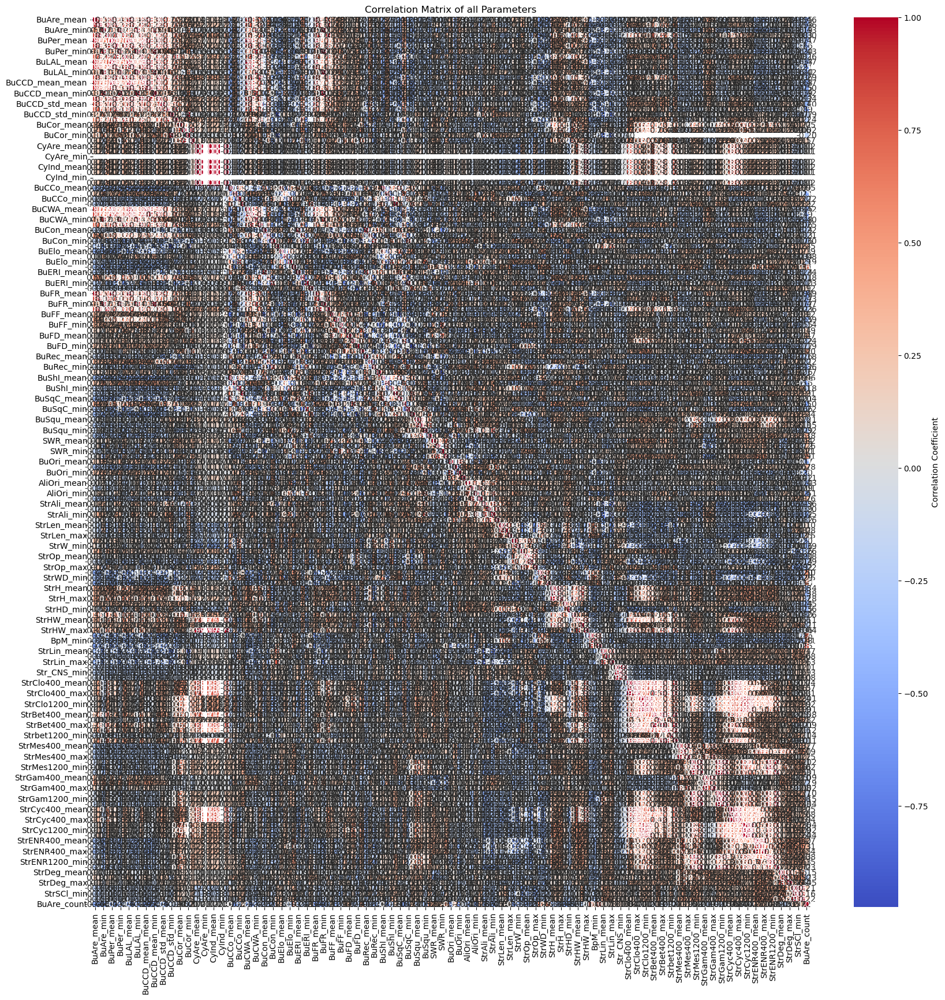

In [102]:
#create correlation matrix of all parameters
corr = params_mean.corr()
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation Matrix of all Parameters')
plt.show()


In [8]:
## PCA

In [177]:
# Select the relevant variables and standardize them

scaler = StandardScaler()
X_scaled = scaler.fit_transform(params_mean.dropna())

In [178]:
# Perform PCA
pca = PCA()
pca.fit(X_scaled)

PCA()

In [179]:
# Get the loadings
loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(len(pca.components_))], index=params_mean.columns)
print(loadings)

                      PC1       PC2       PC3       PC4       PC5       PC6  \
BuAre_mean       0.108468 -0.111208  0.004449  0.104877 -0.031458  0.010073   
BuAre_std        0.110175 -0.098603  0.014610  0.099106  0.016149 -0.014567   
BuAre_min        0.028078  0.019609  0.116540 -0.034802 -0.127240  0.092382   
BuAre_max        0.126080 -0.076272  0.010905  0.064491  0.057704  0.004806   
BuPer_mean       0.120610 -0.095823  0.010032  0.053708 -0.066151  0.029369   
BuPer_std        0.101417 -0.144997  0.024872  0.056128 -0.023363 -0.018319   
BuPer_min        0.035015  0.053352  0.115224 -0.026542 -0.115832  0.063129   
BuPer_max        0.118099 -0.114167  0.022354  0.004008  0.001871 -0.010438   
BuLAL_mean       0.122855 -0.087735  0.019118  0.043500 -0.062412  0.046491   
BuLAL_std        0.109696 -0.141263  0.027344  0.044364 -0.012551  0.017026   
BuLAL_min        0.031112  0.062890  0.116632 -0.017838 -0.111885  0.062331   
BuLAL_max        0.129408 -0.098874  0.015306  0.009

In [180]:
# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

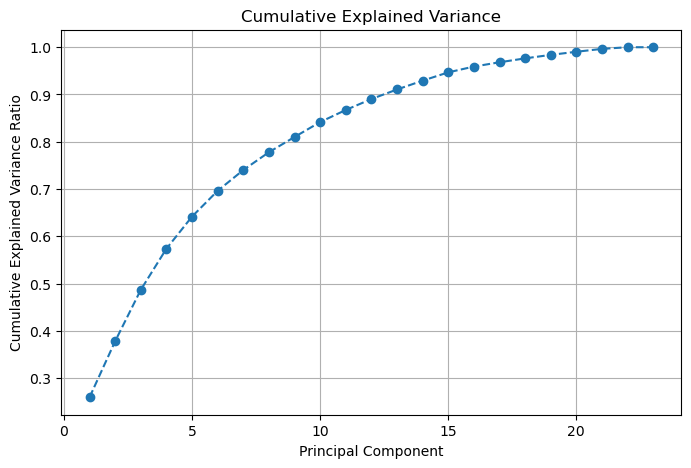

In [181]:
# Create a cumulative variance plot
cumulative_variance = explained_variance_ratio.cumsum()

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.show()

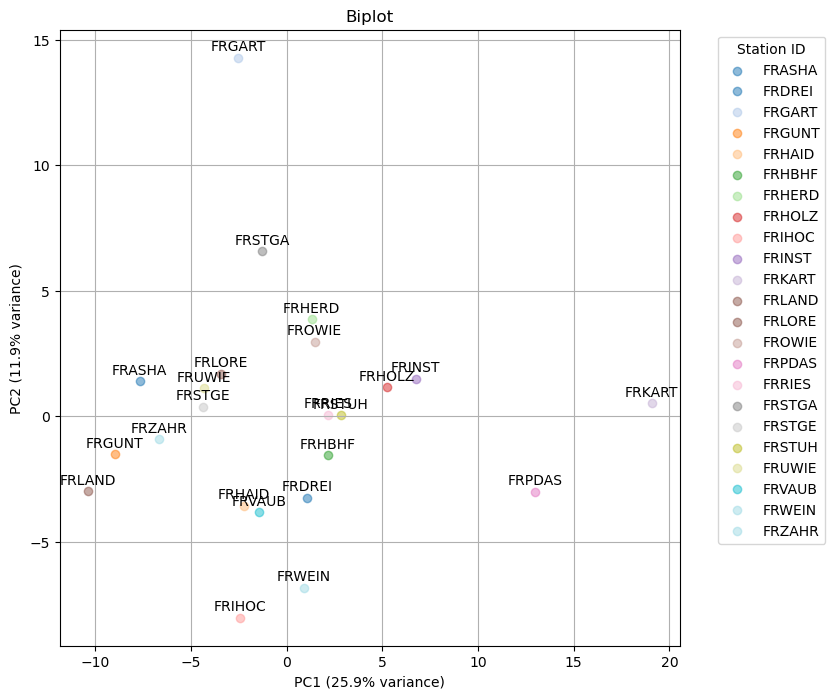

In [182]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming params_mean has a 'station_id' column
station_ids = params_mean.dropna().index
unique_station_ids = station_ids.unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_station_ids)))
color_map = dict(zip(unique_station_ids, colors))

# Plotting the loadings (biplot)
loadings = pca.components_.T

plt.figure(figsize=(8, 8))

# Uncomment if you want to plot the arrows and text for loadings
# for i, var in enumerate(params_mean.columns):
#     plt.arrow(0, 0, loadings[i, 0], loadings[i, 1], color='r', alpha=0.5)
#     plt.text(loadings[i, 0] * 1.15, loadings[i, 1] * 1.15, var, color='g', ha='center', va='center')

# Scatter plot with colors and labels for station_id
for station_id in unique_station_ids:
    idx = station_ids == station_id
    transformed_data = pca.transform(X_scaled)[idx]
    plt.scatter(transformed_data[:, 0], transformed_data[:, 1], 
                alpha=0.5, color=color_map[station_id], label=station_id)
    for i in range(len(transformed_data)):
        plt.annotate(station_id, (transformed_data[i, 0], transformed_data[i, 1]), 
                     textcoords="offset points", xytext=(0, 5), ha='center')

plt.xlabel(f"PC1 ({explained_variance_ratio[0]:.1%} variance)")
plt.ylabel(f"PC2 ({explained_variance_ratio[1]:.1%} variance)")
plt.title('Biplot')
plt.grid(True)
plt.legend(title='Station ID',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

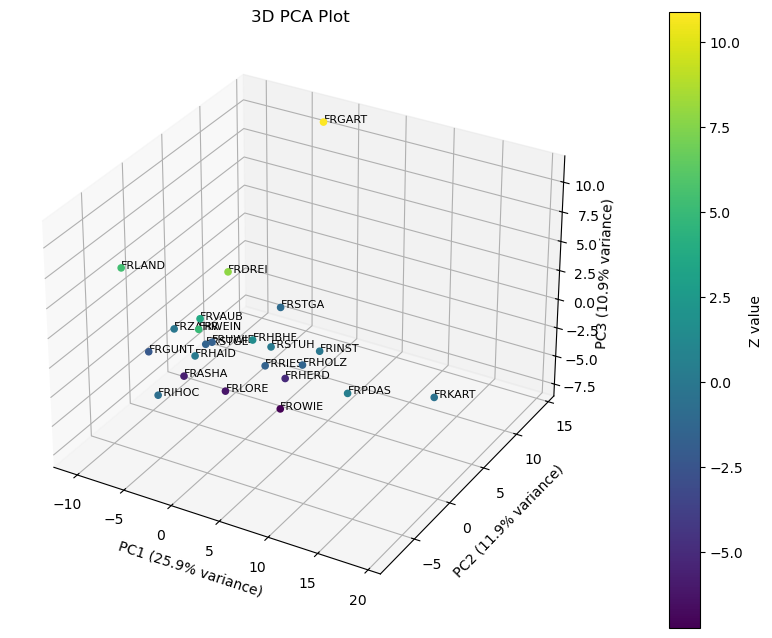

In [183]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Assuming params_mean has a 'station_id' column
station_ids = params_mean.dropna().index
unique_station_ids = station_ids.unique()

# Transform the data using PCA
transformed_data = pca.transform(X_scaled)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with colors corresponding to z-values
sc = ax.scatter(transformed_data[:, 0], transformed_data[:, 1], transformed_data[:, 2], 
                alpha=1, c=transformed_data[:, 2], cmap='viridis')

# Add color bar
cbar = plt.colorbar(sc, ax=ax, pad=0.1)
cbar.set_label('Z value')

# Add text labels for station_id
for station_id in unique_station_ids:
    idx = station_ids == station_id
    for i in range(len(transformed_data[idx])):
        ax.text(transformed_data[idx][i, 0], transformed_data[idx][i, 1], transformed_data[idx][i, 2], 
                station_id, size=8, zorder=1, color='k')

ax.set_xlabel(f"PC1 ({explained_variance_ratio[0]:.1%} variance)")
ax.set_ylabel(f"PC2 ({explained_variance_ratio[1]:.1%} variance)")
ax.set_zlabel(f"PC3 ({explained_variance_ratio[2]:.1%} variance)")
ax.zaxis.labelpad=-0.5

ax.set_title('3D PCA Plot')
plt.show()

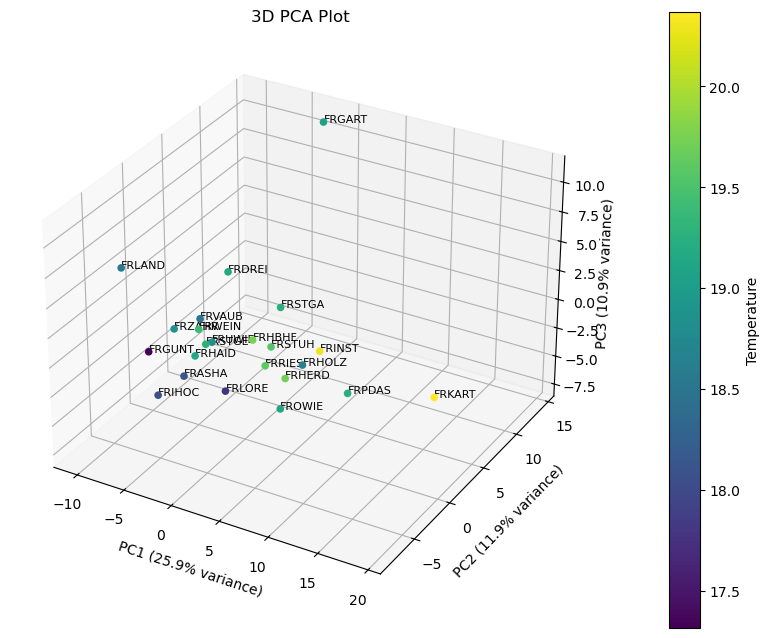

In [184]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Assuming params_mean has a 'station_id' column
station_ids = params_mean.dropna().index
unique_station_ids = station_ids.unique()

# Transform the data using PCA
transformed_data = pca.transform(X_scaled)

# Assuming temp_result is a numpy array or pandas Series with the same length as transformed_data
temp_result = params_mean.dropna().merge(temp_result, left_on='station_id', right_on='station_id')['value']

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with colors corresponding to temp_result
sc = ax.scatter(transformed_data[:, 0], transformed_data[:, 1], transformed_data[:, 2], 
                alpha=1, c=temp_result, cmap='viridis')

# Add color bar
cbar = plt.colorbar(sc, ax=ax, pad=0.1)
cbar.set_label('Temperature')

# Add text labels for station_id
for station_id in unique_station_ids:
    idx = station_ids == station_id
    for i in range(len(transformed_data[idx])):
        ax.text(transformed_data[idx][i, 0], transformed_data[idx][i, 1], transformed_data[idx][i, 2], 
                station_id, size=8, zorder=1, color='k')

ax.set_xlabel(f"PC1 ({explained_variance_ratio[0]:.1%} variance)")
ax.set_ylabel(f"PC2 ({explained_variance_ratio[1]:.1%} variance)")
ax.set_zlabel(f"PC3 ({explained_variance_ratio[2]:.1%} variance)")
ax.zaxis.labelpad=-0.5

ax.set_title('3D PCA Plot')
plt.show()

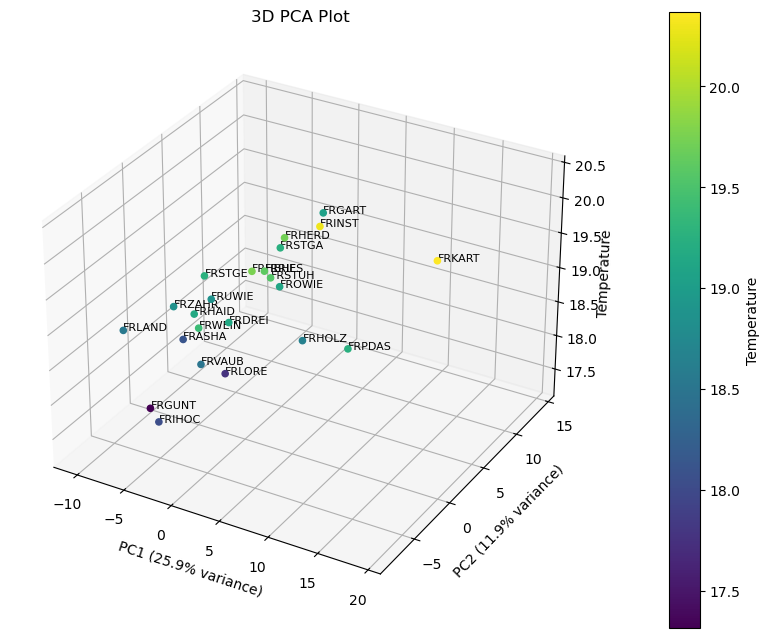

In [201]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Assuming params_mean has a 'station_id' column
station_ids = params_mean.dropna().index
unique_station_ids = station_ids.unique()

# Transform the data using PCA
transformed_data = pca.transform(X_scaled)

# Assuming temp_result is a numpy array or pandas Series with the same length as transformed_data
temp_result = params_mean.dropna().merge(temp_result, left_on='station_id', right_on='station_id')['value']

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with colors corresponding to temp_result
sc = ax.scatter(transformed_data[:, 0], transformed_data[:, 1], temp_result, 
                alpha=1, c=temp_result, cmap='viridis')

# Add color bar
cbar = plt.colorbar(sc, ax=ax, pad=0.1)
cbar.set_label('Temperature')

# Add text labels for station_id
for station_id in unique_station_ids:
    idx = station_ids == station_id
    for i in range(len(transformed_data[idx])):
        ax.text(transformed_data[idx][i, 0], transformed_data[idx][i, 1], temp_result[idx].iloc[i], 
                station_id, size=8, zorder=1, color='k')

ax.set_xlabel(f"PC1 ({explained_variance_ratio[0]:.1%} variance)")
ax.set_ylabel(f"PC2 ({explained_variance_ratio[1]:.1%} variance)")
ax.set_zlabel("Temperature")
ax.zaxis.labelpad=-0.5

ax.set_title('3D PCA Plot')
plt.show()

In [140]:
params_mean

,BuAre_mean,BuAre_std,BuAre_min,BuAre_max,BuPer_mean,BuPer_std,BuPer_min,BuPer_max,BuLAL_mean,BuLAL_std,BuLAL_min,BuLAL_max,BuCCD_mean_mean,BuCCD_mean_std,BuCCD_mean_min,BuCCD_mean_max,BuCCD_std_mean,BuCCD_std_std,BuCCD_std_min,BuCCD_std_max,BuCor_mean,BuCor_std,BuCor_min,BuCor_max,CyAre_mean,CyAre_std,CyAre_min,CyAre_max,CyInd_mean,CyInd_std,CyInd_min,CyInd_max,BuCCo_mean,BuCCo_std,BuCCo_min,BuCCo_max,BuCWA_mean,BuCWA_std,BuCWA_min,BuCWA_max,BuCon_mean,BuCon_std,BuCon_min,BuCon_max,BuElo_mean,BuElo_std,BuElo_min,BuElo_max,BuERI_mean,BuERI_std,BuERI_min,BuERI_max,BuFR_mean,BuFR_std,BuFR_min,BuFR_max,BuFF_mean,BuFF_std,BuFF_min,BuFF_max,BuFD_mean,BuFD_std,BuFD_min,BuFD_max,BuRec_mean,BuRec_std,BuRec_min,BuRec_max,BuShI_mean,BuShI_std,BuShI_min,BuShI_max,BuSqC_mean,BuSqC_std,BuSqC_min,BuSqC_max,BuSqu_mean,BuSqu_std,BuSqu_min,BuSqu_max,SWR_mean,SWR_std,SWR_min,SWR_max,BuOri_mean,BuOri_std,BuOri_min,BuOri_max,AliOri_mean,AliOri_std,AliOri_min,AliOri_max,StrAli_mean,StrAli_std,StrAli_min,StrAli_max,StrLen_mean,StrLen_min,StrLen_max,StrW_mean,StrW_min,StrW_max,StrOp_mean,StrOp_min,StrOp_max,StrWD_mean,StrWD_min,StrWD_max,StrH_mean,StrH_min,StrH_max,StrHD_mean,StrHD_min,StrHD_max,StrHW_mean,StrHW_min,StrHW_max,BpM_mean,BpM_min,BpM_max,StrLin_mean,StrLin_min,StrLin_max,Str_CNS_mean,Str_CNS_min,Str_CNS_max,StrClo400_mean,StrClo400_min,StrClo400_max,StrClo1200_mean,StrClo1200_min,StrClo1200_max,StrBet400_mean,StrBet400_min,StrBet400_max,Strbet1200_mean,Strbet1200_min,Strbet1200_max,StrMes400_mean,StrMes400_min,StrMes400_max,StrMes1200_mean,StrMes1200_min,StrMes1200_max,StrGam400_mean,StrGam400_min,StrGam400_max,StrGam1200_mean,StrGam1200_min,StrGam1200_max,StrCyc400_mean,StrCyc400_min,StrCyc400_max,StrCyc1200_mean,StrCyc1200_min,StrCyc1200_max,StrENR400_mean,StrENR400_min,StrENR400_max,StrENR1200_mean,StrENR1200_min,StrENR1200_max,StrDeg_mean,StrDeg_min,StrDeg_max,StrSCl_mean,StrSCl_min,StrSCl_max,BuAre_count
station_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
FRASHA,112.205929,85.315722,12.115069,297.884242,40.897195,17.884598,15.824471,76.482468,14.367660,6.231304,6.207971,28.346595,6.469614,2.482909,2.845238,10.641582,0.694490,0.948361,0.000172,3.659828,6.583333,3.375968,4,16,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.588531,0.075381,0.393532,0.695367,5.184541,2.964953,2.173930,13.341591,0.973449,0.035639,0.826675,1.000000,0.799525,0.189787,0.360924,0.999568,0.974108,0.035234,0.838682,1.002297,2.333772,0.984559,0.765591,3.894804,5.085521,0.231143,4.765186,5.647028,1.021931,0.025900,1.000000,1.102658,0.942314,0.066243,0.701384,0.999927,0.765484,0.051188,0.627322,0.833887,0.919231,0.083854,0.678842,0.999999,0.314533,0.538289,0.004815,2.828771,0.079746,0.118188,0.000000,0.292504,15.796382,8.442216,1.583257,25.026978,7.769895,4.031599,0.909264,16.291084,9.140864,7.367933,0.052707,21.599750,133.409509,47.246777,193.631604,24.167286,17.604956,30.257857,0.555556,0.500000,0.666667,5.451255,3.898916,6.333537,8.877137,8.185143,9.735269,3.420491,2.873793,4.034847,0.382916,0.321744,0.494804,0.082958,0.081581,0.084662,0.882048,0.724244,0.997446,2472.149747,1024.199402,3196.124920,2.048202e-06,1.472457e-06,2.623947e-06,0.000008,0.000007,0.000008,2.0,0.0,4.0,38.00,29.0,47.0,0.642857,0.285714,1.000000,0.192408,0.182796,0.202020,0.791667,0.583333,1.000000,0.467163,0.460993,0.473333,1.5,1.0,2.0,18.50,17.0,20.0,1.083333,1.000000,1.166667,1.345958,1.326531,1.365385,3.50,3.0,4.0,0.038462,0.000000,0.076923,48
FRBETZ,236.654068,82.889631,35.868504,397.842305,68.215557,20.407154,23.956157,116.070067,22.811459,5.259904,8.474547,32.540806,9.009850,1.563260,4.234892,12.178466,1.981042,1.042738,0.002659,4.363769,10.105263,5.636141,4,26,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.569402,0.053948,0.478371,0.652452,10.674416,6.179579,2.315602,26.057112,0.926452,0.061202,0.806694,1.000000,0.795342,0.0

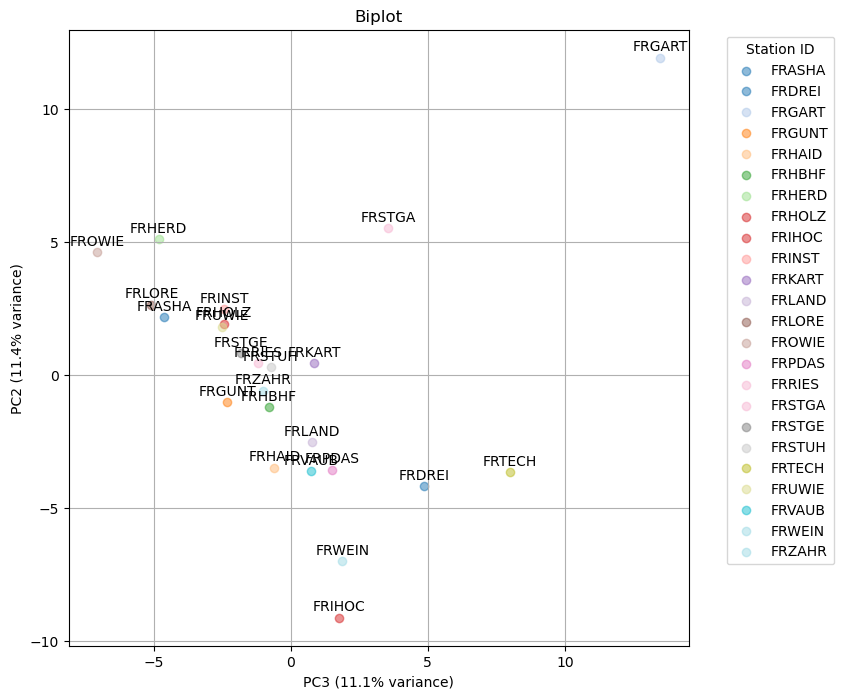

In [116]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming params_mean has a 'station_id' column
station_ids = params_mean.dropna().index
unique_station_ids = station_ids.unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_station_ids)))
color_map = dict(zip(unique_station_ids, colors))

# Plotting the loadings (biplot)
loadings = pca.components_.T

plt.figure(figsize=(8, 8))

# Uncomment if you want to plot the arrows and text for loadings
# for i, var in enumerate(params_mean.columns):
#     plt.arrow(0, 0, loadings[i, 0], loadings[i, 1], color='r', alpha=0.5)
#     plt.text(loadings[i, 0] * 1.15, loadings[i, 1] * 1.15, var, color='g', ha='center', va='center')

# Scatter plot with colors and labels for station_id
for station_id in unique_station_ids:
    idx = station_ids == station_id
    transformed_data = pca.transform(X_scaled)[idx]
    plt.scatter(transformed_data[:, 2], transformed_data[:, 1], 
                alpha=0.5, color=color_map[station_id], label=station_id)
    for i in range(len(transformed_data)):
        plt.annotate(station_id, (transformed_data[i, 2], transformed_data[i, 1]), 
                     textcoords="offset points", xytext=(0, 5), ha='center')

plt.xlabel(f"PC3 ({explained_variance_ratio[2]:.1%} variance)")
plt.ylabel(f"PC2 ({explained_variance_ratio[1]:.1%} variance)")
plt.title('Biplot')
plt.grid(True)
plt.legend(title='Station ID',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [117]:
# add building counts, standard deviation, means and other stats to the PCA

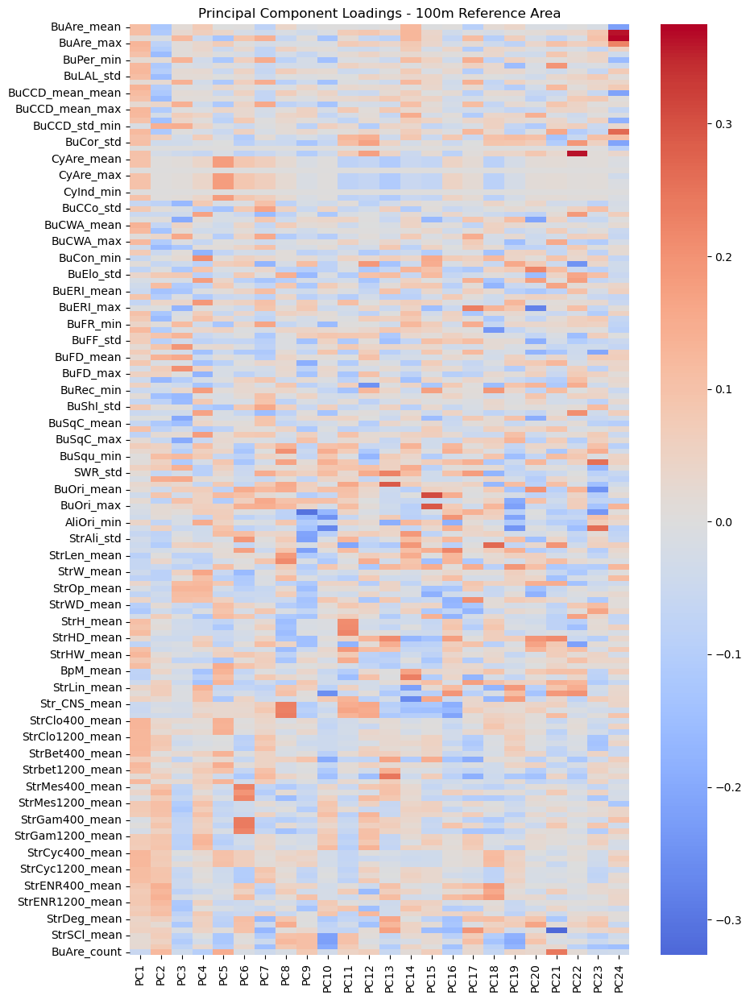

In [118]:
# Convert loadings to DataFrame for better visualization
loadings_df = pd.DataFrame(loadings, columns=[f'PC{i+1}' for i in range(loadings.shape[1])], index=params_mean.columns)

plt.figure(figsize=(10, 15))
sns.heatmap(loadings_df, annot=False, cmap='coolwarm', center=0)
plt.title('Principal Component Loadings - 100m Reference Area')
plt.savefig('/Users/lisawink/Documents/paper1/figures/PCA_100m_loadings.svg',bbox_inches='tight')
plt.show()

In [119]:
# Assume `loadings` is a 2D numpy array with variables as rows and PCs as columns
loadings_df = pd.DataFrame(loadings, columns=[f'PC{i+1}' for i in range(loadings.shape[1])])

# the index should be the variable names
loadings_df.index = params_mean.columns

# Focus on the first x PCs
loadings_subset = loadings_df.iloc[:, :15]

In [120]:
correlation_matrix = loadings_subset.T.corr()

In [121]:
# Define a threshold for high correlation (e.g., 0.8)
threshold = 0.8

# Find variable pairs with high absolute correlation
high_corr_pairs = [(var1, var2) for var1 in correlation_matrix.columns for var2 in correlation_matrix.columns 
                   if abs(correlation_matrix.loc[var1, var2]) > threshold and var1 != var2]

In [122]:
high_corr_pairs

[('BuAre_mean', 'BuAre_std'),
 ('BuAre_mean', 'BuPer_mean'),
 ('BuAre_mean', 'BuPer_std'),
 ('BuAre_mean', 'BuLAL_mean'),
 ('BuAre_mean', 'BuLAL_std'),
 ('BuAre_mean', 'BuCCD_mean_mean'),
 ('BuAre_mean', 'BuFR_mean'),
 ('BuAre_mean', 'BuFR_std'),
 ('BuAre_std', 'BuAre_mean'),
 ('BuAre_std', 'BuAre_max'),
 ('BuAre_std', 'BuPer_std'),
 ('BuAre_std', 'BuLAL_std'),
 ('BuAre_std', 'BuCCD_mean_std'),
 ('BuAre_std', 'BuFR_std'),
 ('BuAre_min', 'BuPer_min'),
 ('BuAre_min', 'BuLAL_min'),
 ('BuAre_min', 'BuCCD_mean_min'),
 ('BuAre_min', 'BuCWA_min'),
 ('BuAre_min', 'BuFR_min'),
 ('BuAre_max', 'BuAre_std'),
 ('BuAre_max', 'BuPer_std'),
 ('BuAre_max', 'BuPer_max'),
 ('BuAre_max', 'BuLAL_std'),
 ('BuAre_max', 'BuLAL_max'),
 ('BuAre_max', 'BuCCD_mean_std'),
 ('BuAre_max', 'BuFR_std'),
 ('BuPer_mean', 'BuAre_mean'),
 ('BuPer_mean', 'BuLAL_mean'),
 ('BuPer_mean', 'BuCCD_mean_mean'),
 ('BuPer_mean', 'BuCWA_mean'),
 ('BuPer_mean', 'BuFR_mean'),
 ('BuPer_std', 'BuAre_mean'),
 ('BuPer_std', 'BuAre_std'),


In [123]:
Z = linkage(1 - abs(correlation_matrix), method='ward')
plt.figure(figsize=(15, 10))
dendrogram(Z, labels=correlation_matrix.columns, leaf_rotation=90)
plt.title("Hierarchical Clustering of Variables Based on Similarity in PCs")
plt.xlabel("Variables")
plt.ylabel("Dissimilarity")
plt.show()

ValueError: The condensed distance matrix must contain only finite values.

In [186]:
transformed_data

array([[-7.68467130e+00,  1.39629390e+00, -5.72048070e+00,
         1.41135318e+00,  1.47125324e-01,  7.15318961e+00,
        -6.82609997e-01,  5.79687657e+00, -2.09347459e+00,
         2.57985134e+00, -1.73296754e-01,  5.46240963e-01,
        -1.87041627e+00, -1.19419491e+00, -2.21123179e+00,
         9.92499879e-01, -1.24047482e+00, -6.22672599e-01,
         3.06707120e-01, -5.20237484e-02, -2.09331704e-01,
        -3.60209203e-01, -1.74546721e-15],
       [ 1.06751706e+00, -3.24768238e+00,  7.82429422e+00,
        -3.42115577e+00, -5.87233927e+00,  6.04541920e+00,
         4.33228344e+00,  1.34066206e+00,  1.92146648e+00,
        -3.27260986e+00, -1.15655856e+00, -2.37497126e+00,
        -7.79524002e-01,  4.26401648e-01,  3.22625213e-01,
        -1.17414611e+00, -5.51219053e-01,  5.38915516e-01,
        -3.28514610e-01, -8.11757367e-01, -3.94413610e-01,
         5.68280646e-01,  1.80364629e-15],
       [-2.55355630e+00,  1.42757762e+01,  1.08708258e+01,
         4.16454951e+00,  3.5

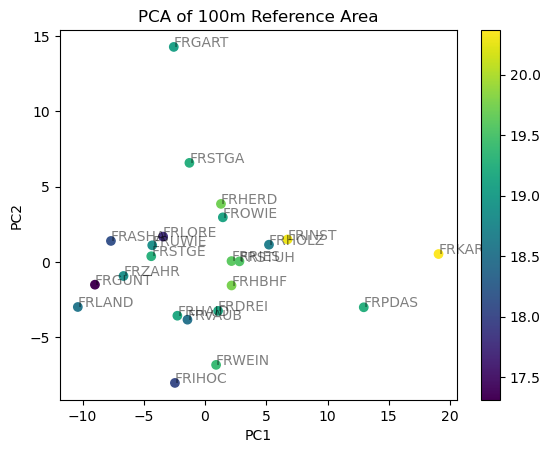

In [207]:
# 2d plot pf pc1 vs pc2 with colour temp_result and label by station ID

plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=temp_result, cmap='viridis')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA of 100m Reference Area')

for i, station_id in enumerate(station_ids):
    plt.annotate(station_id, (transformed_data[i, 0], transformed_data[i, 1]),alpha=0.5)

plt.colorbar()
plt.show()


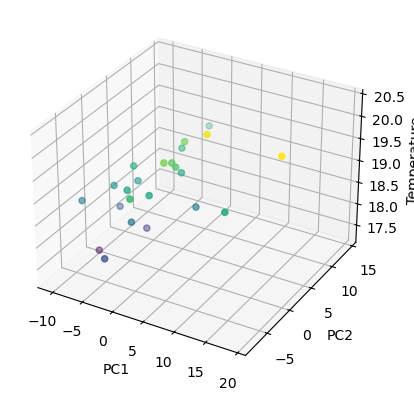

In [197]:
#3d scatter plot and colour corresponding to temperature

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(transformed_data[:, 0], transformed_data[:, 1], temp_result, c=temp_result, cmap='viridis')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('Temperature')
plt.show()

In [243]:
loadings_df['PC1'].sort_values(ascending=False)

BuCWA_mean         1.341679e-01
BuLAL_max          1.319977e-01
BuAre_max          1.288976e-01
StrClo400_min      1.288554e-01
StrClo400_mean     1.287987e-01
StrHW_mean         1.278917e-01
StrClo400_max      1.265710e-01
StrCyc400_mean     1.261532e-01
StrClo1200_max     1.259587e-01
StrClo1200_mean    1.258522e-01
BuCCD_mean_max     1.250805e-01
StrCyc400_max      1.243566e-01
BuLAL_mean         1.238028e-01
StrCyc400_min      1.234970e-01
StrClo1200_min     1.227721e-01
BuCCD_std_mean     1.220899e-01
BuPer_mean         1.219477e-01
BuCWA_max          1.217343e-01
StrBet400_mean     1.216713e-01
BuPer_max          1.209289e-01
StrBet400_max      1.208212e-01
Strbet1200_max     1.200362e-01
BuFR_max           1.179966e-01
BuCWA_std          1.175065e-01
BuCCD_std_max      1.173844e-01
BuCCD_mean_mean    1.156860e-01
StrHW_max          1.134126e-01
StrH_max           1.131067e-01
StrCyc1200_min     1.121359e-01
StrCyc1200_mean    1.120508e-01
BuAre_std          1.115417e-01
StrCyc12

In [244]:
loadings_df['PC2'].sort_values(ascending=False)

SWR_min            1.466457e-01
StrENR400_mean     1.413470e-01
BuCCD_std_min      1.404250e-01
StrENR400_max      1.377001e-01
BuFD_mean          1.353361e-01
StrENR400_min      1.261933e-01
StrMes400_min      1.243131e-01
BuAre_count        1.199457e-01
StrENR1200_mean    1.196257e-01
BuElo_max          1.118266e-01
StrENR1200_max     1.114414e-01
BuSqu_min          1.111578e-01
StrMes1200_mean    1.070285e-01
StrMes1200_min     1.060282e-01
StrMes1200_max     1.003047e-01
StrENR1200_min     9.880331e-02
StrCyc1200_min     9.374653e-02
BuFF_mean          9.334397e-02
StrMes400_mean     9.271607e-02
StrGam1200_max     9.264467e-02
BuFF_min           9.221939e-02
StrGam1200_mean    9.218101e-02
StrCyc1200_mean    9.143509e-02
StrGam400_min      9.141471e-02
BuOri_std          9.008410e-02
StrCyc1200_max     8.982583e-02
StrGam1200_min     8.919431e-02
StrClo1200_min     8.633913e-02
StrClo1200_mean    7.992683e-02
StrCyc400_min      7.753131e-02
BuElo_std          7.719154e-02
StrSCl_m

In [245]:
loadings_df['PC4'].sort_values(ascending=False)

BuCon_min          2.099570e-01
BuERI_min          1.869404e-01
BuSqC_min          1.824274e-01
BuRec_min          1.792577e-01
BuElo_min          1.791776e-01
BuCCo_min          1.707795e-01
BuShI_min          1.685726e-01
StrW_mean          1.633463e-01
AliOri_min         1.521958e-01
StrLin_mean        1.344699e-01
StrGam1200_min     1.292953e-01
StrOp_mean         1.290030e-01
StrGam1200_mean    1.230438e-01
StrW_max           1.202161e-01
StrOp_min          1.155782e-01
StrGam1200_max     1.104319e-01
BuSqu_mean         1.075855e-01
StrW_min           1.060738e-01
StrLin_min         1.014242e-01
StrMes1200_max     9.953827e-02
StrLin_max         9.943379e-02
StrOp_max          9.777846e-02
StrMes1200_mean    9.678751e-02
BuFR_std           9.571469e-02
BuElo_mean         9.521136e-02
BuShI_mean         7.945437e-02
StrENR1200_max     7.870261e-02
BuSqu_min          7.748097e-02
StrHD_min          7.724774e-02
BuCCo_mean         7.663201e-02
Strbet1200_mean    7.608932e-02
BuAre_me

In [276]:
loadings_df['PC12'].sort_values(ascending=False)

BuCon_max          1.868354e-01
BuCor_max          1.726646e-01
BuCor_std          1.714732e-01
Str_CNS_mean       1.592022e-01
Str_CNS_max        1.575153e-01
SWR_std            1.518425e-01
Str_CNS_min        1.501871e-01
StrLen_min         1.476170e-01
BuCor_mean         1.428791e-01
StrGam1200_max     1.339675e-01
StrMes1200_max     1.306901e-01
StrHD_mean         1.281824e-01
BuRec_min          1.265382e-01
StrENR1200_max     1.236554e-01
StrHD_max          1.165363e-01
StrMes400_max      1.119363e-01
StrGam1200_mean    1.076012e-01
StrGam400_max      1.041136e-01
BuFD_mean          1.034272e-01
BpM_min            1.020869e-01
BuFD_max           1.013409e-01
BuElo_std          1.003203e-01
SWR_mean           9.842932e-02
StrGam400_mean     9.669628e-02
BuAre_std          8.638796e-02
StrMes400_mean     8.500706e-02
StrGam1200_min     8.295582e-02
BuFF_mean          8.128200e-02
StrCyc1200_max     7.922045e-02
StrW_min           7.421348e-02
StrAli_mean        7.048559e-02
SWR_max 

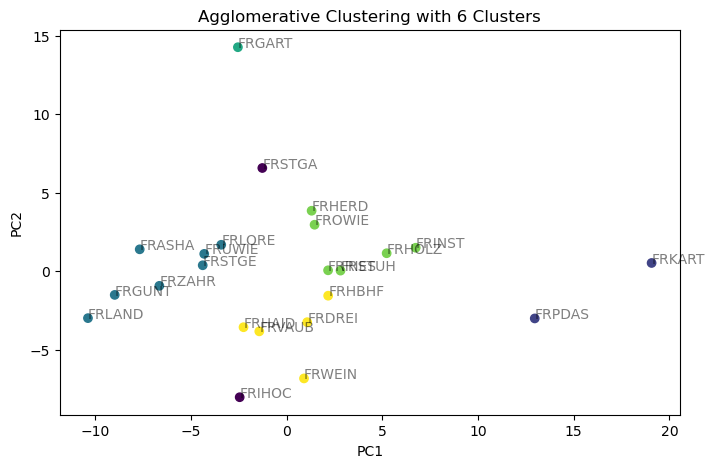

In [210]:
# find clusters in PCs

# Perform Agglomerative Clustering
n_clusters = 6
clustering = AgglomerativeClustering(n_clusters=n_clusters)
clustering.fit(transformed_data)

# Get the cluster labels
cluster_labels = clustering.labels_

# Plot the clusters
plt.figure(figsize=(8, 5))
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=cluster_labels, cmap='viridis')
for i, station_id in enumerate(station_ids):
    plt.annotate(station_id, (transformed_data[i, 0], transformed_data[i, 1]),alpha=0.5)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'Agglomerative Clustering with {n_clusters} Clusters')
plt.show()



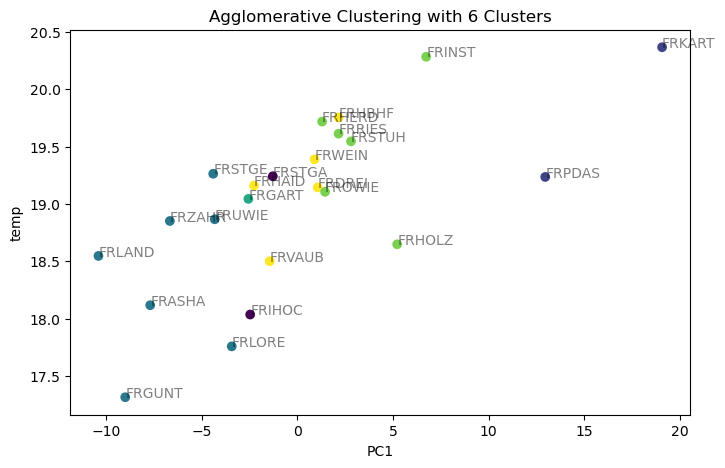

In [214]:
# Plot the clusters
plt.figure(figsize=(8, 5))
plt.scatter(transformed_data[:, 0], temp_result, c=cluster_labels, cmap='viridis')
for i, station_id in enumerate(station_ids):
    plt.annotate(station_id, (transformed_data[i, 0], temp_result.iloc[i]), alpha=0.5)
plt.xlabel('PC1')
plt.ylabel('temp')
plt.title(f'Agglomerative Clustering with {n_clusters} Clusters')
plt.show()

In [215]:
transformed_data

array([[-7.68467130e+00,  1.39629390e+00, -5.72048070e+00,
         1.41135318e+00,  1.47125324e-01,  7.15318961e+00,
        -6.82609997e-01,  5.79687657e+00, -2.09347459e+00,
         2.57985134e+00, -1.73296754e-01,  5.46240963e-01,
        -1.87041627e+00, -1.19419491e+00, -2.21123179e+00,
         9.92499879e-01, -1.24047482e+00, -6.22672599e-01,
         3.06707120e-01, -5.20237484e-02, -2.09331704e-01,
        -3.60209203e-01, -1.74546721e-15],
       [ 1.06751706e+00, -3.24768238e+00,  7.82429422e+00,
        -3.42115577e+00, -5.87233927e+00,  6.04541920e+00,
         4.33228344e+00,  1.34066206e+00,  1.92146648e+00,
        -3.27260986e+00, -1.15655856e+00, -2.37497126e+00,
        -7.79524002e-01,  4.26401648e-01,  3.22625213e-01,
        -1.17414611e+00, -5.51219053e-01,  5.38915516e-01,
        -3.28514610e-01, -8.11757367e-01, -3.94413610e-01,
         5.68280646e-01,  1.80364629e-15],
       [-2.55355630e+00,  1.42757762e+01,  1.08708258e+01,
         4.16454951e+00,  3.5

R^2: 1.0
Intercept: 19.02249228611501
Coefficients:
PC1: 0.07638077906832402
PC2: 0.02719882588752147
PC3: 0.028579480302099898
PC4: -0.05550944589415091
PC5: 0.0060184074568787015
PC6: 0.017955380092432593
PC7: -0.013965650095477632
PC8: 0.006094963524804557
PC9: 0.021591108520925717
PC10: -0.0009310538665004179
PC11: -0.0906404602217508
PC12: 0.08967952455075441
PC13: 0.060846759396134924
PC14: -0.01151626157769612
PC15: 0.029727017533939446
PC16: 0.1251107702790962
PC17: 0.08637222799589714
PC18: 0.07667555313507517
PC19: 0.03851337146024864
PC20: 0.12439999421384797
PC21: 0.15495995808483826
PC22: 0.22756055443847434
PC23: 1.2248076077158215e-16


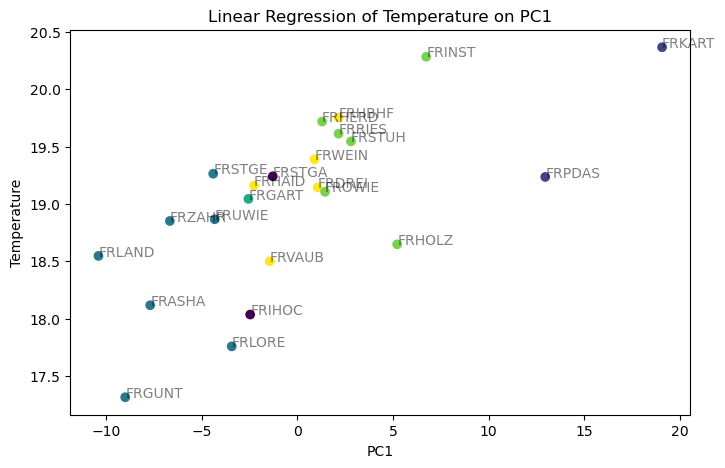

In [238]:
# do linear regression on the PCs and temp and print r squared for each PC


from sklearn.linear_model import LinearRegression


# Fit a linear regression model
model = LinearRegression()
model.fit(transformed_data, temp_result)

# Get the coefficients
coefficients = model.coef_
intercept = model.intercept_

# Get the R^2 value
r_squared = model.score(transformed_data, temp_result)

print(f'R^2: {r_squared}')


# Print the coefficients
print(f'Intercept: {intercept}')
print('Coefficients:')
for i, coef in enumerate(coefficients):
    print(f'PC{i+1}: {coef}')

    
    
# Plot the regression line
plt.figure(figsize=(8, 5))
plt.scatter(transformed_data[:, 0], temp_result, c=cluster_labels, cmap='viridis', linestyle='None')
plt.plot(transformed_data[:, 0], model.predict(transformed_data), color='red', linestyle='None')
for i, station_id in enumerate(station_ids):
    plt.annotate(station_id, (transformed_data[i, 0], temp_result.iloc[i]), alpha=0.5)
plt.xlabel('PC1')
plt.ylabel('Temperature')
plt.title('Linear Regression of Temperature on PC1')
plt.show()


In [247]:
from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_squared_error, mean_absolute_error 

In [248]:
# creating train and test sets 
X_train, X_test, y_train, y_test = train_test_split(transformed_data, temp_result, test_size=0.3, random_state=101) 
  
# creating a regression model 
model = LinearRegression() 
  
# fitting the model 
model.fit(X_train, y_train) 
  
# making predictions 
predictions = model.predict(X_test) 
  
# model evaluation 
print('mean_squared_error : ', mean_squared_error(y_test, predictions)) 
print('mean_absolute_error : ', mean_absolute_error(y_test, predictions)) 

mean_squared_error :  0.6364945237977808
mean_absolute_error :  0.6679185846130906


Intercept: 19.02249228611501
Coefficient: 0.07638077906832402
R^2: 0.46683681987777514


<Figure size 800x500 with 0 Axes>

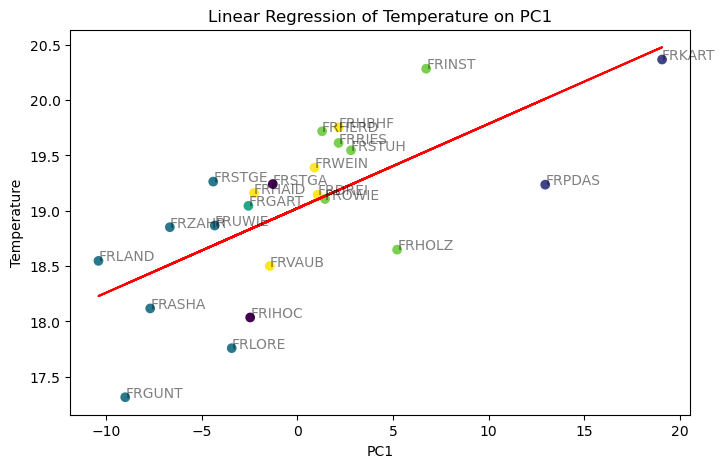

Intercept: 19.02249228611501
Coefficient: 0.02719882588752284
R^2: 0.02710254629846376


<Figure size 800x500 with 0 Axes>

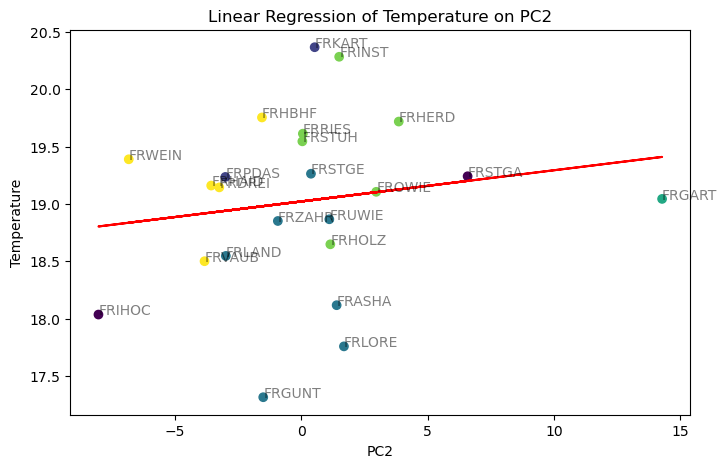

Intercept: 19.02249228611501
Coefficient: 0.028579480302099742
R^2: 0.027384626729612283


<Figure size 800x500 with 0 Axes>

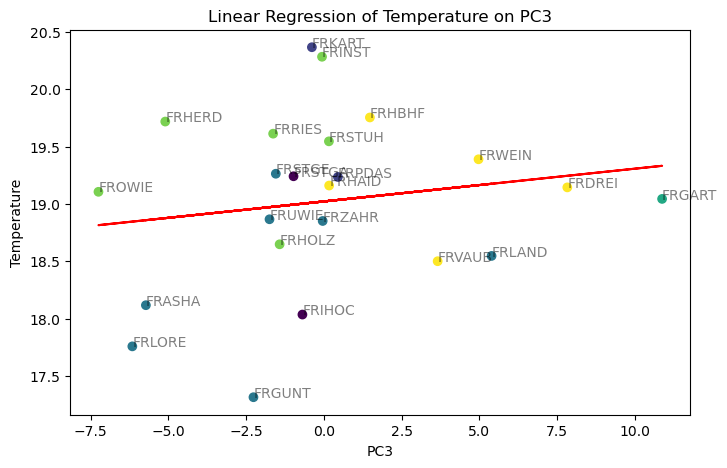

Intercept: 19.02249228611501
Coefficient: -0.05550944589415092
R^2: 0.08265979365686782


<Figure size 800x500 with 0 Axes>

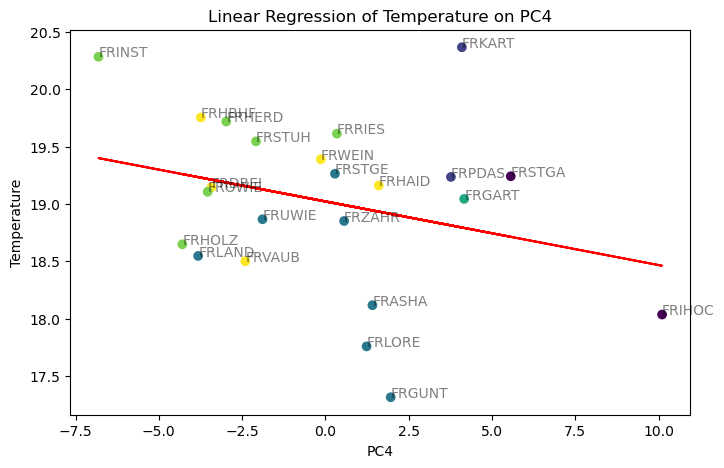

Intercept: 19.02249228611501
Coefficient: 0.0060184074568788316
R^2: 0.0007594363719427566


<Figure size 800x500 with 0 Axes>

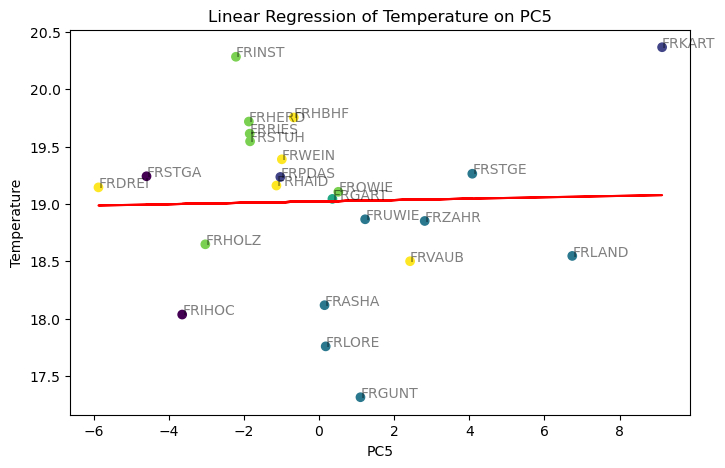

Intercept: 19.02249228611501
Coefficient: 0.017955380092432777
R^2: 0.005423265073505101


<Figure size 800x500 with 0 Axes>

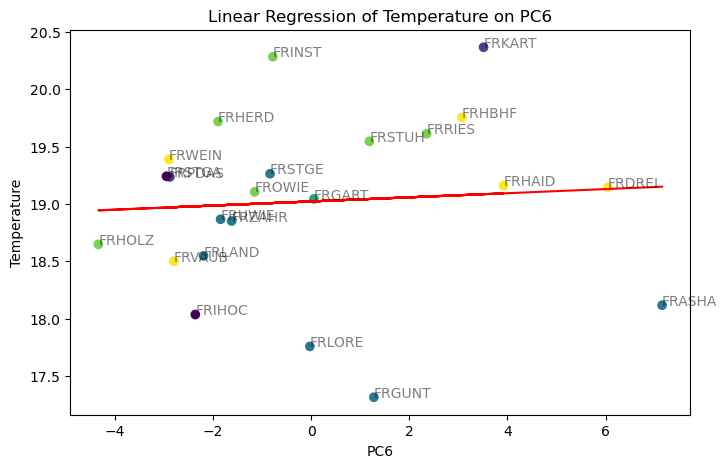

Intercept: 19.02249228611501
Coefficient: -0.01396565009547757
R^2: 0.002642281414911518


<Figure size 800x500 with 0 Axes>

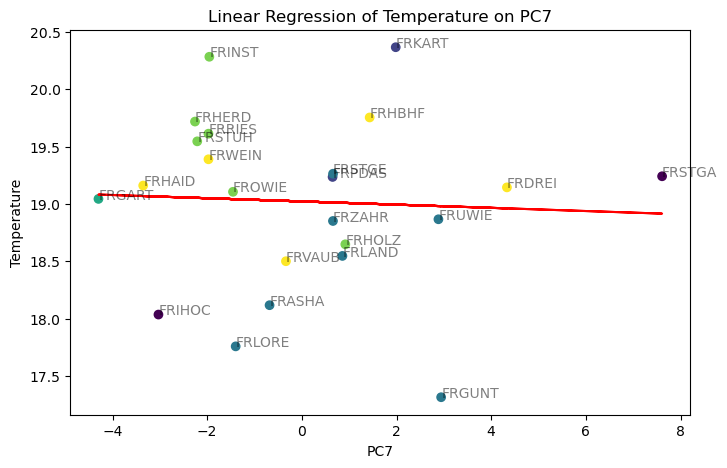

Intercept: 19.02249228611501
Coefficient: 0.0060949635248047475
R^2: 0.00043212126369129855


<Figure size 800x500 with 0 Axes>

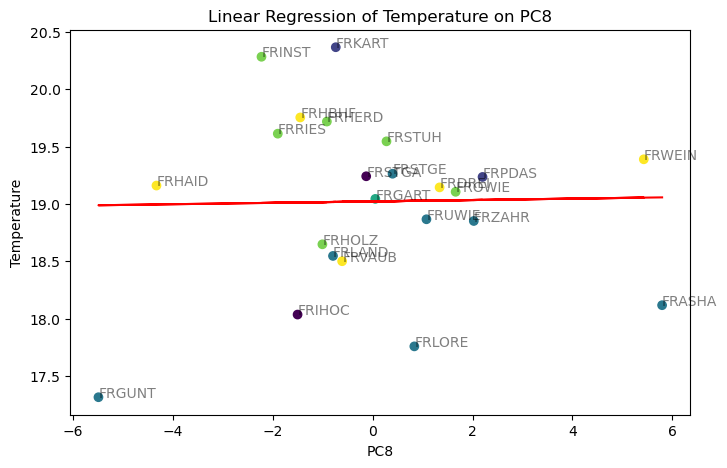

Intercept: 19.02249228611501
Coefficient: 0.02159110852092562
R^2: 0.004634606417928122


<Figure size 800x500 with 0 Axes>

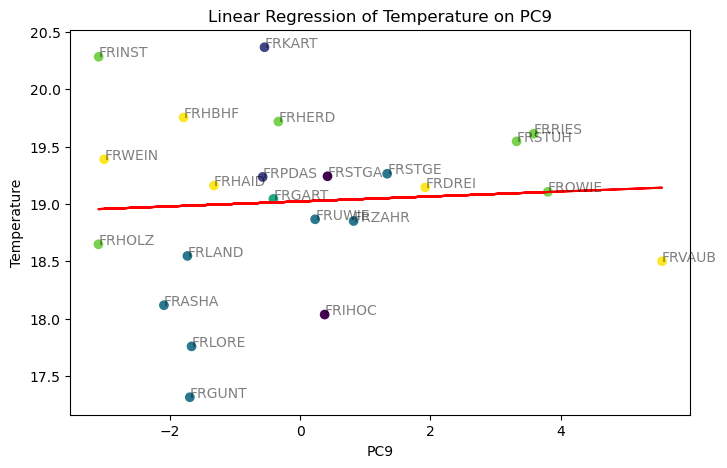

Intercept: 19.02249228611501
Coefficient: -0.0009310538665002134
R^2: 8.451262330178011e-06


<Figure size 800x500 with 0 Axes>

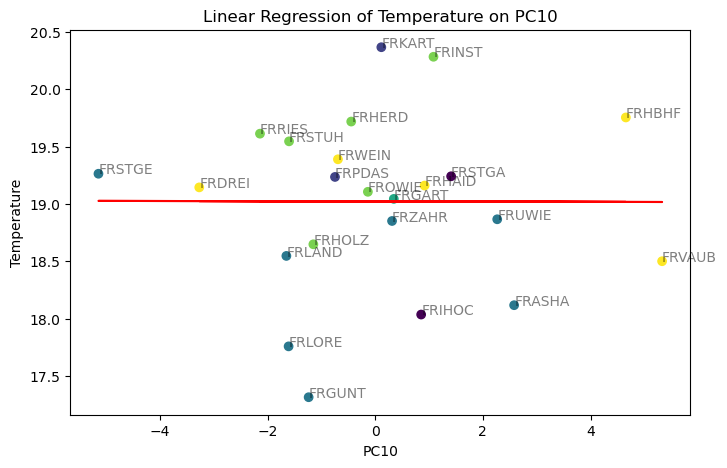

Intercept: 19.02249228611501
Coefficient: -0.09064046022175067
R^2: 0.06476951057575209


<Figure size 800x500 with 0 Axes>

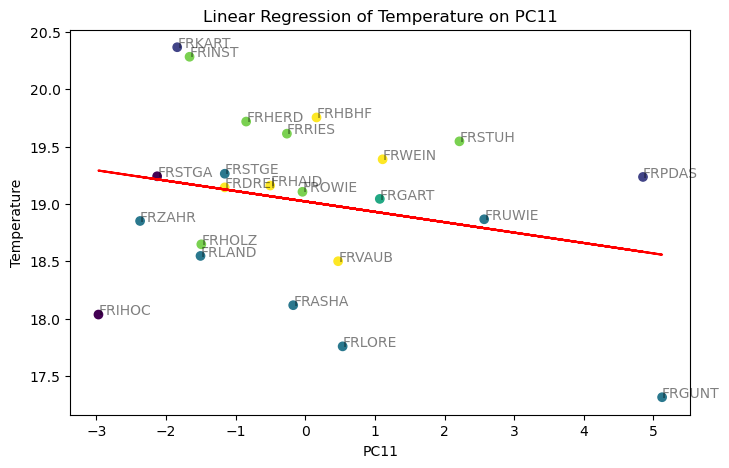

Intercept: 19.02249228611501
Coefficient: 0.08967952455075426
R^2: 0.05749460379424054


<Figure size 800x500 with 0 Axes>

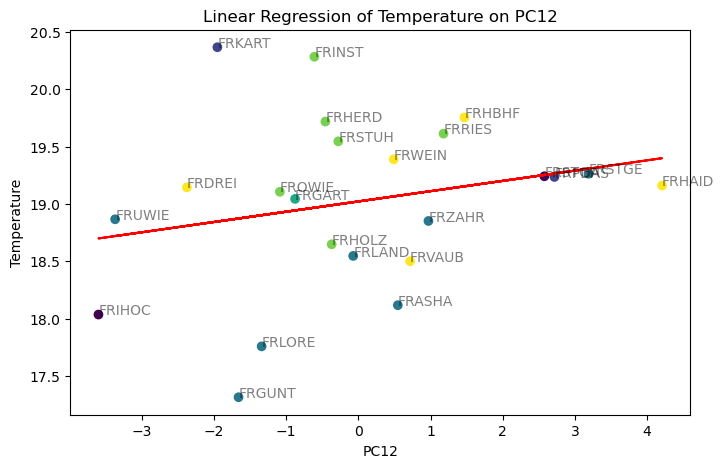

Intercept: 19.02249228611501
Coefficient: 0.060846759396134806
R^2: 0.023059478585869875


<Figure size 800x500 with 0 Axes>

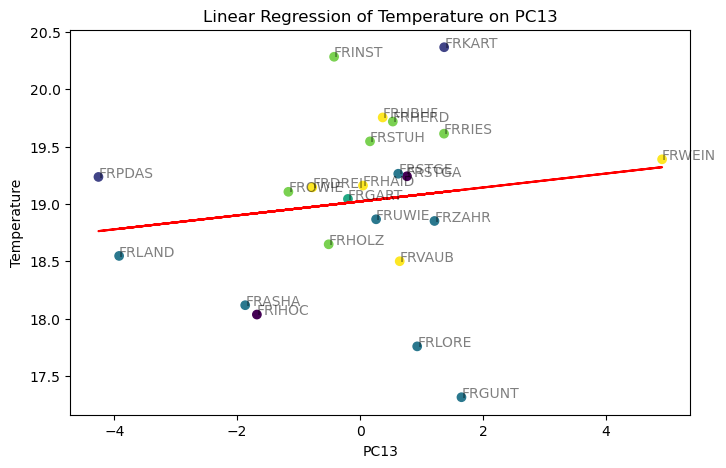

Intercept: 19.02249228611501
Coefficient: -0.01151626157769623
R^2: 0.000764483363608015


<Figure size 800x500 with 0 Axes>

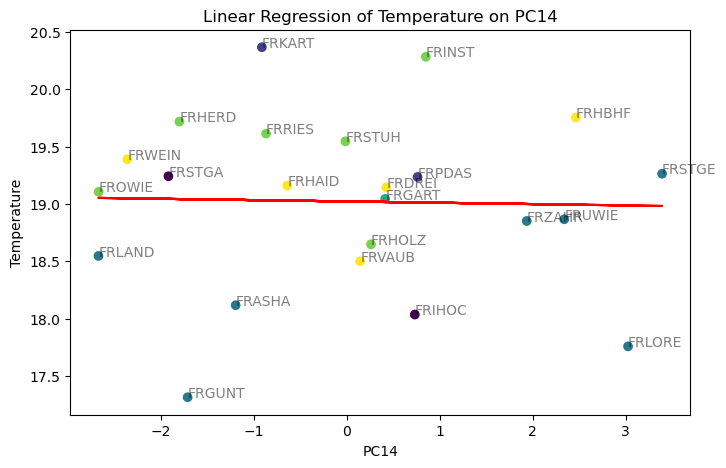

Intercept: 19.02249228611501
Coefficient: 0.02972701753393932
R^2: 0.004786270973343276


<Figure size 800x500 with 0 Axes>

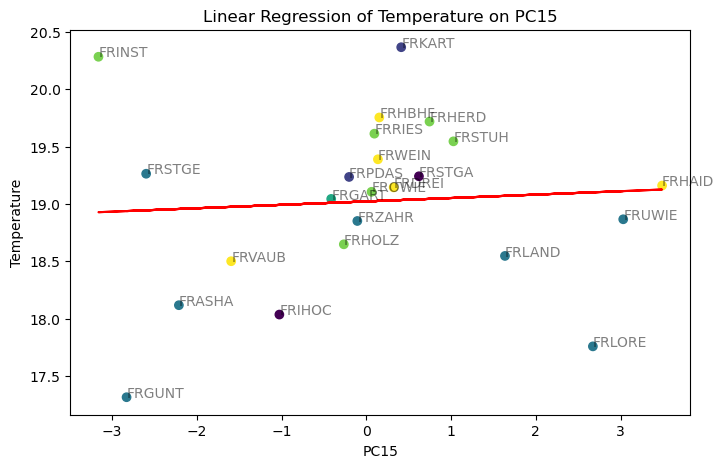

Intercept: 19.02249228611501
Coefficient: 0.12511077027909598
R^2: 0.05925700734356831


<Figure size 800x500 with 0 Axes>

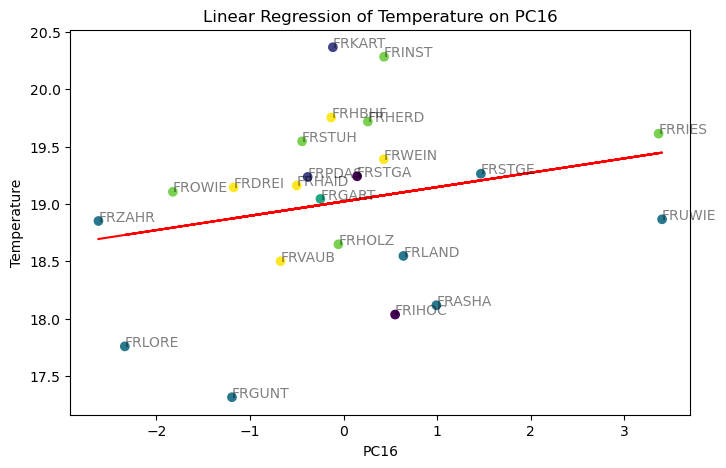

Intercept: 19.02249228611501
Coefficient: 0.08637222799589714
R^2: 0.020845959760390942


<Figure size 800x500 with 0 Axes>

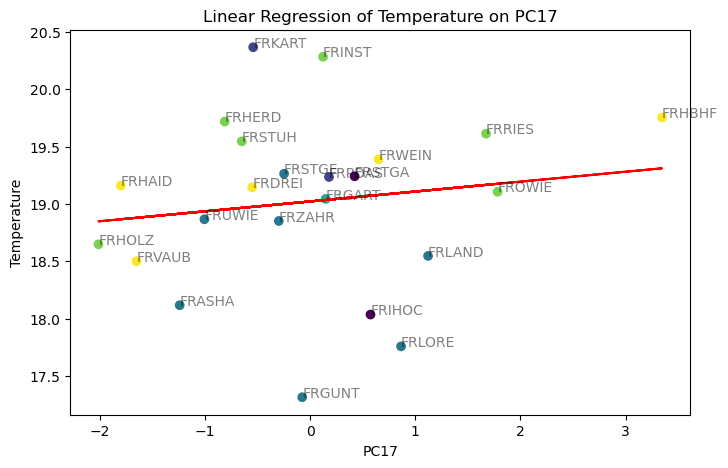

Intercept: 19.02249228611501
Coefficient: 0.07667555313507518
R^2: 0.01502999352883172


<Figure size 800x500 with 0 Axes>

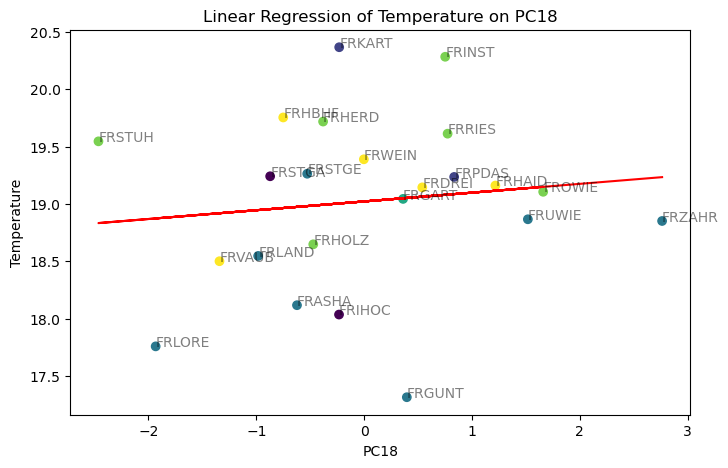

Intercept: 19.02249228611501
Coefficient: 0.03851337146024855
R^2: 0.0033733108191827954


<Figure size 800x500 with 0 Axes>

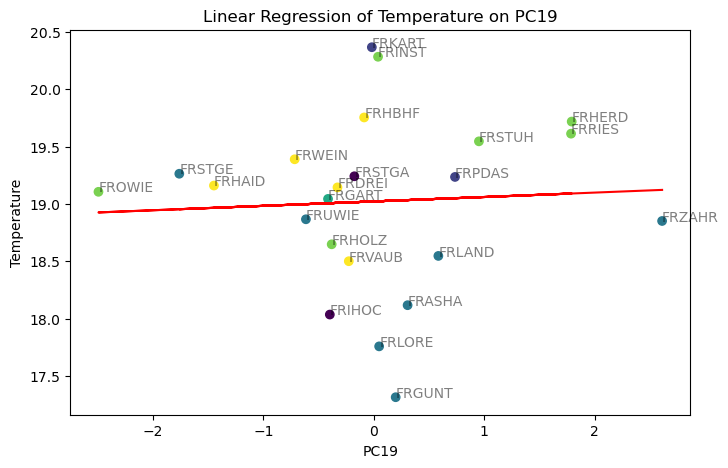

Intercept: 19.02249228611501
Coefficient: 0.12439999421384831
R^2: 0.03156041833706391


<Figure size 800x500 with 0 Axes>

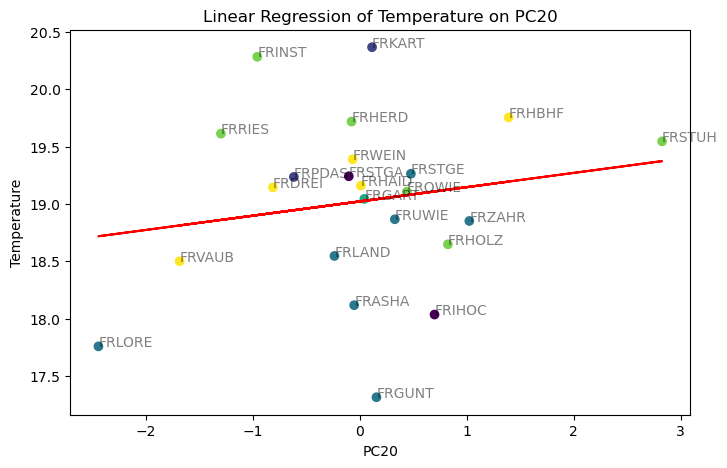

Intercept: 19.02249228611501
Coefficient: 0.15495995808483845
R^2: 0.04519969413816638


<Figure size 800x500 with 0 Axes>

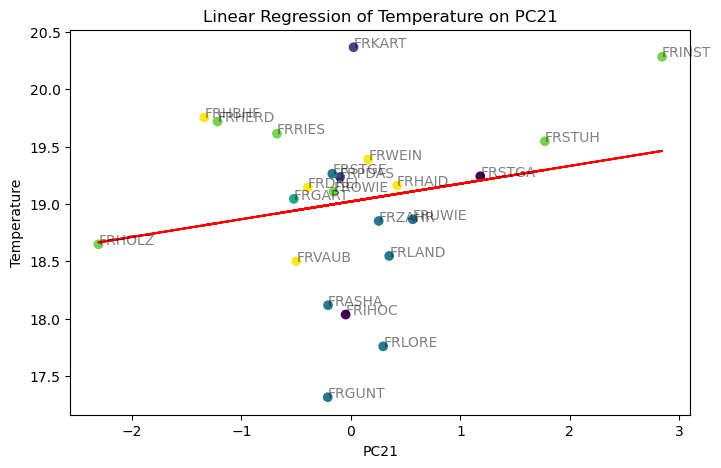

Intercept: 19.02249228611501
Coefficient: 0.22756055443847398
R^2: 0.05597532041295772


<Figure size 800x500 with 0 Axes>

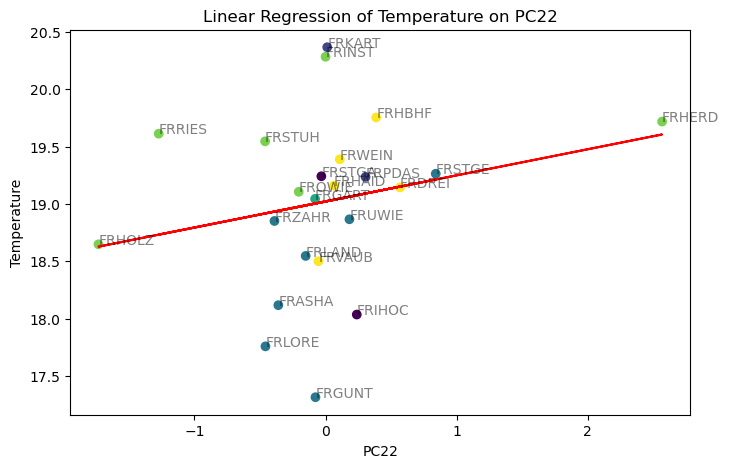

In [240]:
# regression between temperature and PC1

for i in range(0, 22):
    plt.figure(figsize=(8, 5))
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(transformed_data[:, i].reshape(-1, 1), temp_result)

    # Get the coefficients
    coefficients = model.coef_
    intercept = model.intercept_

    # Get the R^2 value
    r_squared = model.score(transformed_data[:, i].reshape(-1, 1), temp_result)

    # Print the coefficients
    print(f'Intercept: {intercept}')
    print(f'Coefficient: {coefficients[0]}')
    print(f'R^2: {r_squared}')

    # Plot the regression line

    plt.figure(figsize=(8, 5))
    plt.scatter(transformed_data[:, i], temp_result, c=cluster_labels, cmap='viridis')
    plt.plot(transformed_data[:, i], model.predict(transformed_data[:, i].reshape(-1, 1)), color='red')
    for j, station_id in enumerate(station_ids):
        plt.annotate(station_id, (transformed_data[j, i], temp_result.iloc[j]), alpha=0.5)
    plt.xlabel('PC'+str(i+1))
    plt.ylabel('Temperature')
    plt.title('Linear Regression of Temperature on PC'+str(i+1))
    plt.show()


In [ ]:
# creating train and test sets 
X_train, X_test, y_train, y_test = train_test_split(transformed_data, temp_result, test_size=0.3, random_state=101) 
  
# creating a regression model 
model = LinearRegression() 
  
# fitting the model 
model.fit(X_train, y_train) 
  
# making predictions 
predictions = model.predict(X_test) 
  
# model evaluation 
print('mean_squared_error : ', mean_squared_error(y_test, predictions)) 
print('mean_absolute_error : ', mean_absolute_error(y_test, predictions)) 

In [275]:

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

######################################## Data preparation #########################################

# creating train and test sets 
X_train, X_test, y_train, y_test = train_test_split(transformed_data, temp_result, test_size=0.3, random_state=101) 
  
################################################ Train #############################################

rf = RandomForestRegressor(n_estimators=100, n_jobs=-1)
rf.fit(X_train, y_train)

# Built-in feature importance (Gini Importance)
importances = rf.feature_importances_
feature_imp_df = pd.DataFrame({'Feature': range(1,24), 'Gini Importance': importances}).sort_values('Gini Importance', ascending=False) 
print(feature_imp_df)

    Feature  Gini Importance
0         1         0.373787
3         4         0.110056
11       12         0.108312
12       13         0.086323
2         3         0.043061
10       11         0.036763
18       19         0.030913
14       15         0.030456
7         8         0.028393
8         9         0.024519
20       21         0.021245
15       16         0.019049
4         5         0.017641
21       22         0.010898
17       18         0.010834
9        10         0.010261
6         7         0.008756
16       17         0.007626
1         2         0.006052
5         6         0.005333
13       14         0.004919
19       20         0.004803
22       23         0.000000


In [271]:
importances.sum()

1.0

In [ ]:
# Create a bar plot for feature importance
plt.figure(figsize=(8, 4))
plt.barh(feature_names, importances, color='skyblue')
plt.xlabel('Gini Importance')
plt.title('Feature Importance - Gini Importance')
plt.gca().invert_yaxis()  # Invert y-axis for better visualization
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import linear_model
from mpl_toolkits.mplot3d import Axes3D

######################################## Data preparation #########################################

file = 'https://aegis4048.github.io/downloads/notebooks/sample_data/unconv_MV_v5.csv'
df = pd.read_csv(file)

X = transformed_data[:, 0]
Y = df['Prod']

######################## Prepare model data point for visualization ###############################

x = X[:, 0]
y = X[:, 1]
z = Y

x_pred = np.linspace(6, 24, 30)   # range of porosity values
y_pred = np.linspace(0, 100, 30)  # range of brittleness values
xx_pred, yy_pred = np.meshgrid(x_pred, y_pred)
model_viz = np.array([xx_pred.flatten(), yy_pred.flatten()]).T

################################################ Train #############################################

ols = linear_model.LinearRegression()
model = ols.fit(X, Y)
predicted = model.predict(model_viz)

############################################## Evaluate ############################################

r2 = model.score(X, Y)

############################################## Plot ################################################

plt.style.use('default')

fig = plt.figure(figsize=(12, 4))

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

axes = [ax1, ax2, ax3]

for ax in axes:
    ax.plot(x, y, z, color='k', zorder=15, linestyle='none', marker='o', alpha=0.5)
    ax.scatter(xx_pred.flatten(), yy_pred.flatten(), predicted, facecolor=(0,0,0,0), s=20, edgecolor='#70b3f0')
    ax.set_xlabel('Porosity (%)', fontsize=12)
    ax.set_ylabel('Brittleness', fontsize=12)
    ax.set_zlabel('Gas Prod. (Mcf/day)', fontsize=12)
    ax.locator_params(nbins=4, axis='x')
    ax.locator_params(nbins=5, axis='x')

ax1.text2D(0.2, 0.32, 'aegis4048.github.io', fontsize=13, ha='center', va='center',
           transform=ax1.transAxes, color='grey', alpha=0.5)
ax2.text2D(0.3, 0.42, 'aegis4048.github.io', fontsize=13, ha='center', va='center',
           transform=ax2.transAxes, color='grey', alpha=0.5)
ax3.text2D(0.85, 0.85, 'aegis4048.github.io', fontsize=13, ha='center', va='center',
           transform=ax3.transAxes, color='grey', alpha=0.5)

ax1.view_init(elev=28, azim=120)
ax2.view_init(elev=4, azim=114)
ax3.view_init(elev=60, azim=165)

fig.suptitle('$R^2 = %.2f$' % r2, fontsize=20)

fig.tight_layout()

R^2: 0.5494966135346426


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_3851/2600463521.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(transformed_data[:, 0], transformed_data[:, 3], temp_result, c='black', cmap='viridis')


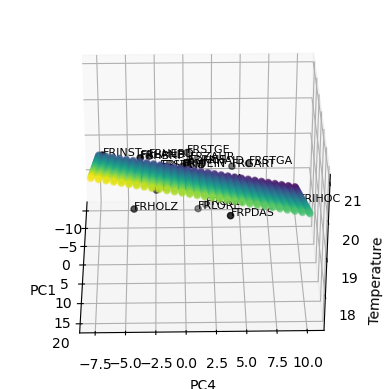

In [288]:
# linear regression of PC1 and PC4 and temp

# for visualisation
x_pred = np.linspace(-10, 20, 30)   # range of porosity values
y_pred = np.linspace(-7.5, 10, 30)  # range of brittleness values
xx_pred, yy_pred = np.meshgrid(x_pred, y_pred)
model_viz = np.array([xx_pred.flatten(), yy_pred.flatten()]).T

# Fit a linear regression model
model = LinearRegression()
model.fit(transformed_data[:, [0,3]], temp_result)
predicted = model.predict(model_viz)

# Get the coefficients
coefficients = model.coef_
intercept = model.intercept_

# Get the R^2 value
r_squared = model.score(transformed_data[:, [0,3]], temp_result)

print(f'R^2: {r_squared}')

# plot on 3d scatter plot

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(transformed_data[:, 0], transformed_data[:, 3], temp_result, c='black', cmap='viridis')
ax.scatter(xx_pred.flatten(), yy_pred.flatten(), predicted, c=predicted,alpha=0.5)
ax.set_xlabel('PC1')
ax.set_ylabel('PC4')
# Add text labels for station_id
for station_id in unique_station_ids:
    idx = station_ids == station_id
    for i in range(len(transformed_data[idx])):
        ax.text(transformed_data[idx][i, 0], transformed_data[idx][i, 3], temp_result[idx].iloc[i], 
                station_id, size=8, zorder=1, color='k')
ax.set_zlabel('Temperature')
for ii in np.arange(0, 360, 1):
    ax.view_init(elev=32, azim=ii)
    fig.savefig('gif_image%d.png' % ii)
plt.show()




In [283]:
# linear regression of PC1 and PC12 and temp

# Fit a linear regression model
model = LinearRegression()
model.fit(transformed_data[:, [0,3,11]], temp_result)

# Get the coefficients
coefficients = model.coef_
intercept = model.intercept_

# Get the R^2 value
r_squared = model.score(transformed_data[:, [0,3,11]], temp_result)

print(f'R^2: {r_squared}')


R^2: 0.6069912173288828
